In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


# Png to Pny

The script preprocesses images and masks for segmentation, combines them, and applies data augmentation techniques, before saving the processed and augmented data in a structured format, addressing the challenges of image transformation and class mapping with specific color thresholds

In [ ]:
import os
import numpy as np
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm
import cv2

def preprocess_image_pil(image_path, target_size=(224, 224), noise_reduction=True):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_array = cv2.resize(image, (224, 224))
    return img_array

def convert_mask_to_class(mask, color_to_class, threshold=50, green_threshold=30):
    if mask.ndim != 3 or mask.shape[2] != 3:
        raise ValueError("Mask must be an RGB image")

    class_mask = np.full((mask.shape[0], mask.shape[1]), 90, dtype=np.uint8) 

    for color, class_value in color_to_class.items():
        # Apply a specific threshold for green colors
        current_threshold = green_threshold if color_to_class[color] in [20, 60] else threshold

        # Calculate the squared distance from this color to all pixels in the mask
        distance = np.sum((mask - np.array(color))**2, axis=-1)

        # Assign class_value to pixels where the distance is within the specific threshold
        class_mask[distance < (current_threshold**2)] = class_value

    class_mask = np.expand_dims(class_mask, axis=-1)

    return class_mask

def preprocess_mask(mask_path, target_size=(224, 224), color_to_class=None):
    mask = Image.open(mask_path)
    mask = mask.resize(target_size)
    mask = np.array(mask)

    if color_to_class:
        mask = convert_mask_to_class(mask, color_to_class)
    return mask


def stack_image_and_mask(image, mask):
    combined = np.concatenate((image, mask), axis=-1)
    return combined

def augment_image(image, mask, datagen, augmentations=2):
    # Stack the image and mask together as if they are one multi-channel image
    combined = np.concatenate((image, mask), axis=-1)

    # Expand dimensions to add the batch dimension
    combined_batch = np.expand_dims(combined, axis=0)

    aug_images = []
    for _ in range(augmentations):
        it = datagen.flow(combined_batch, batch_size=1)
        aug_combined = it.next()[0]

        if aug_combined.shape[0] == 1:
            aug_combined = np.squeeze(aug_combined, axis=0)

        # Split the augmented combined image back into image and mask
        aug_image = aug_combined[:, :, :image.shape[2]]  
        aug_mask = aug_combined[:, :, image.shape[2]:]  

        aug_combined = np.concatenate((aug_image, aug_mask), axis=-1)
        aug_images.append(aug_combined)

    return aug_images

# Color to class mapping
color_to_class = {
    (250, 149, 10): 10,  # Orange - Hood
    (19, 98, 19): 20,   # Dark Green - Front Door
    (249, 249, 10): 30, # Yellow - Rear Door
    (10, 248, 250): 40, # Cyan - Frame
    (149, 7, 149): 50,  # Purple - Rear Quarter Panel
    (5, 249, 9): 60,    # Light Green - Trunk Lid
    (20, 19, 249): 70,  # Blue - Fender
    (249, 9, 250): 80,  # Pink - Bumper
    (0,0,0): 90 # Other
}

datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.15,
    zoom_range=0.05,
    horizontal_flip=True,
    fill_mode='nearest'
)

base_folder_path = "/content/drive/MyDrive/DTU/DL/PROJECT/Data/carseg_data/images"
categories = ["photo","black_5_doors","orange_3_doors"]

output_path = "/content/drive/MyDrive/DTU/Deep Learning/PROJECT/Data/processed_data"

for category in categories:
    images_path = os.path.join(base_folder_path, category, "no_segmentation")
    masks_path = os.path.join(base_folder_path, category, "with_segmentation")
    os.makedirs(output_path, exist_ok=True)
    image_files = os.listdir(images_path)

    for image_file in tqdm(image_files, desc=f'Processing {category}'):
        if image_file.lower().endswith(('.png', '.jpg', '.jpeg')):
            new_file_name = f"{category[:2]}_{image_file}".replace('.png', '.npy').replace('.jpg', '.npy').replace('.jpeg', '.npy')
            image_path = os.path.join(images_path, image_file)
            mask_path = os.path.join(masks_path, image_file)
            processed_image = preprocess_image_pil(image_path)
            processed_mask = preprocess_mask(mask_path, color_to_class=color_to_class)
            combined = stack_image_and_mask(processed_image, processed_mask)
            combined_file = os.path.join(output_path, new_file_name)
            np.save(combined_file, combined)

            # Determine augmentation count based on the category
            if category == "photo":
                augmentation_count = 11
            elif category == "black_5_doors":
                augmentation_count = 2
            else: 
                augmentation_count = 1

            # Generate augmented images and masks
            augmented_images = augment_image(processed_image, processed_mask, datagen, augmentations=augmentation_count)
            for i, aug_img in enumerate(augmented_images):
                aug_img_file = os.path.join(output_path, f"{new_file_name.replace('.npy', '')}_aug_{i}.npy")
                np.save(aug_img_file, aug_img)


Processing orange_3_doors: 100%|██████████| 2001/2001 [20:18<00:00,  1.64it/s]


# Visualization

The script loads and displays images and their segmentation masks from .npy files, applying a predefined class-to-color mapping to the masks for visualization, and includes a function to randomly display a percentage of these images from a specified directory.

Displaying ph_0087_aug_7.npy


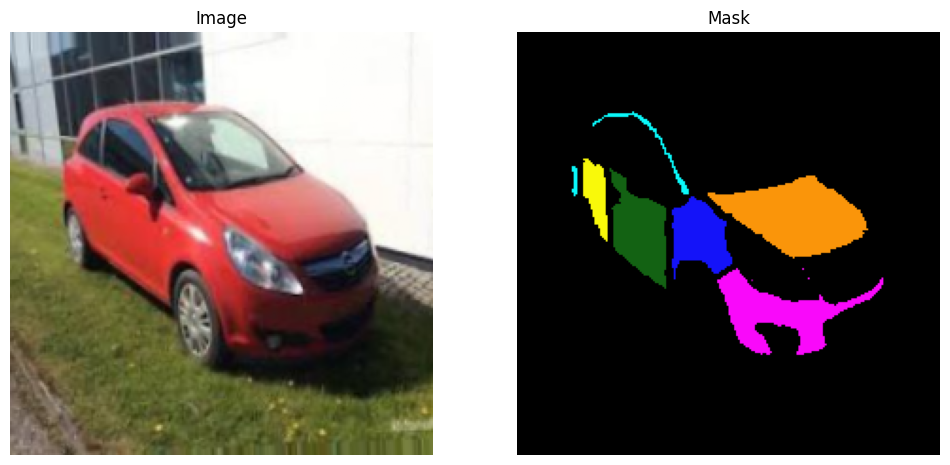

Displaying or_0773.npy


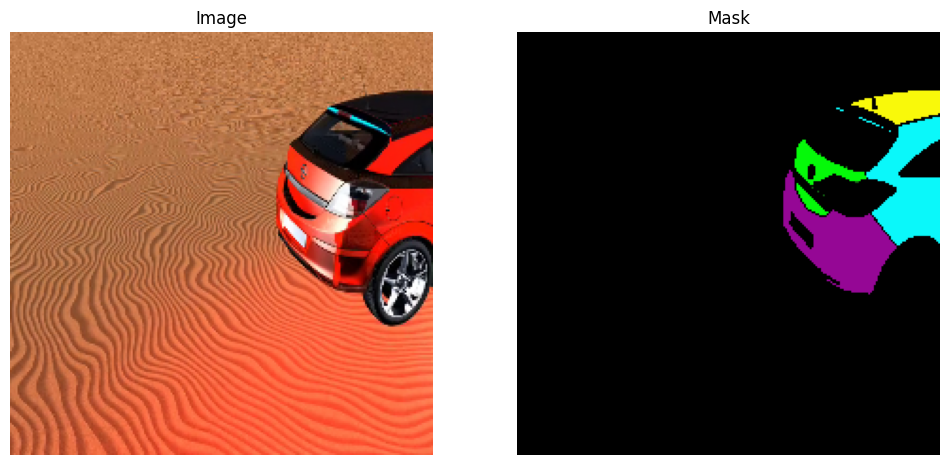

Displaying ph_0099_aug_1.npy


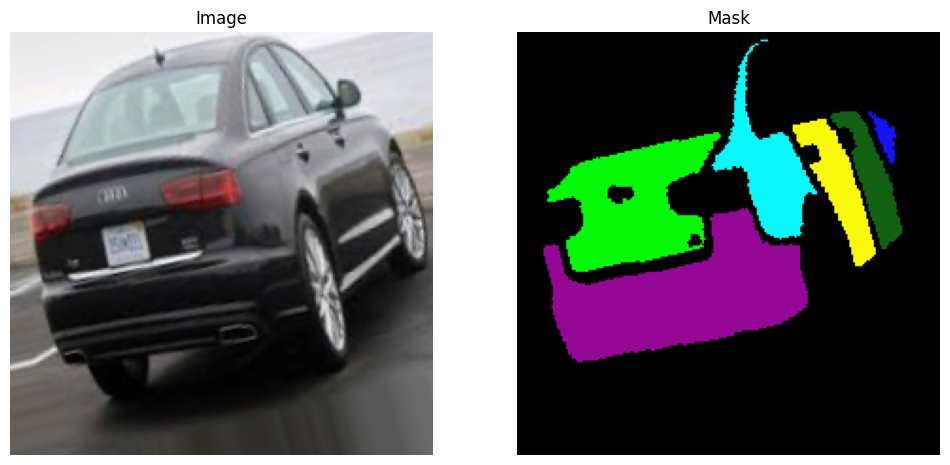

Displaying bl_0814_aug_2.npy


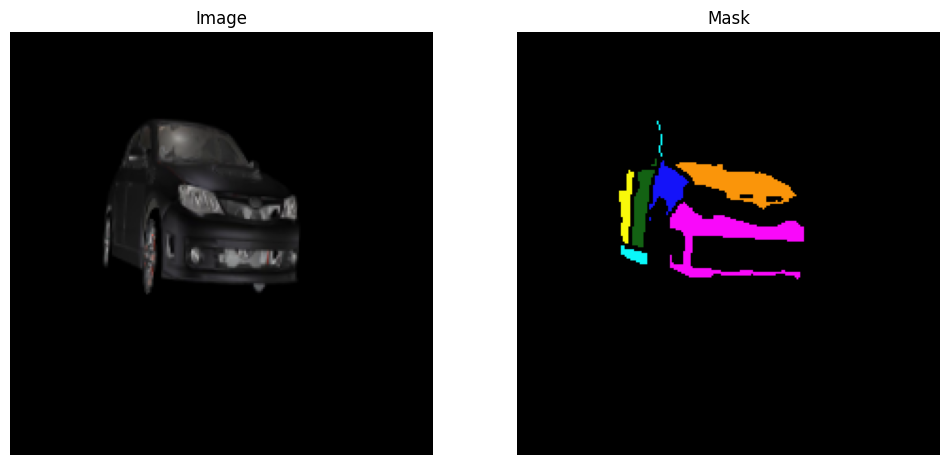

Displaying or_1608.npy


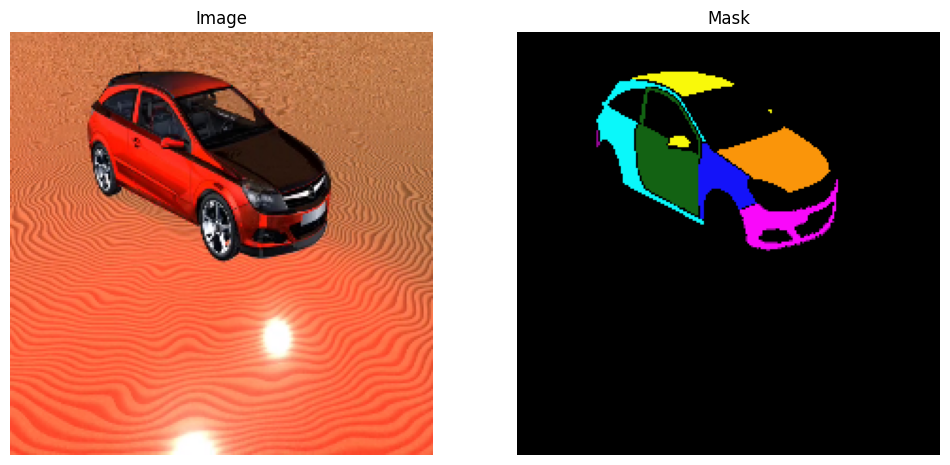

Displaying or_0814.npy


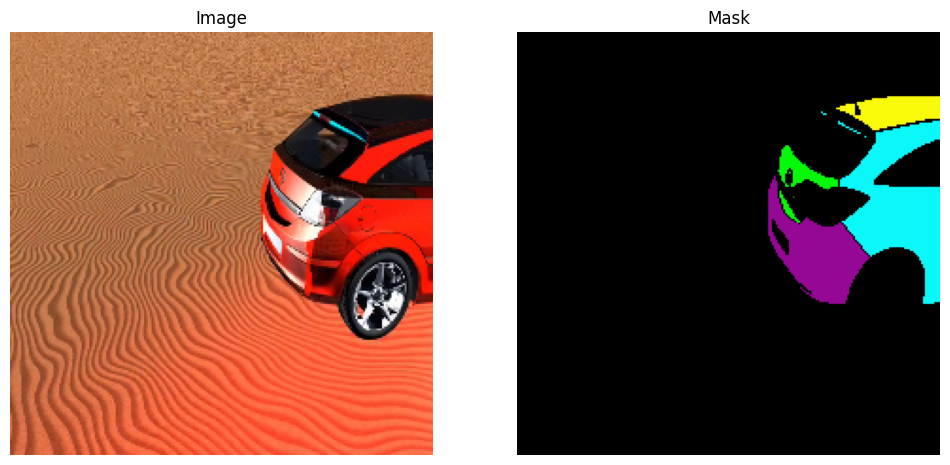

Displaying bl_0758.npy


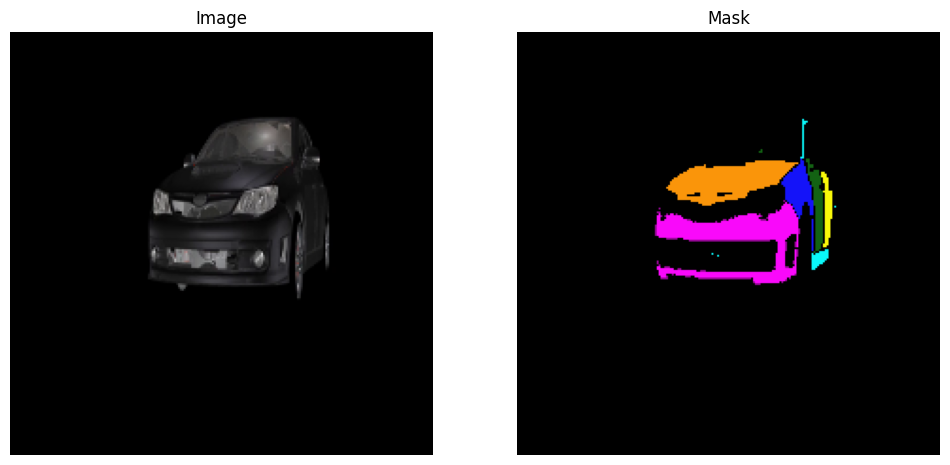

Displaying or_0334_aug_1.npy


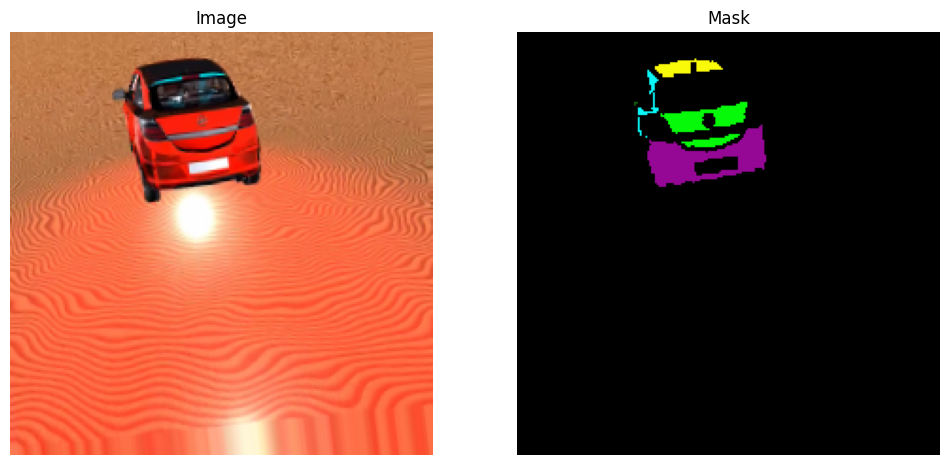

Displaying or_0986_aug_1.npy


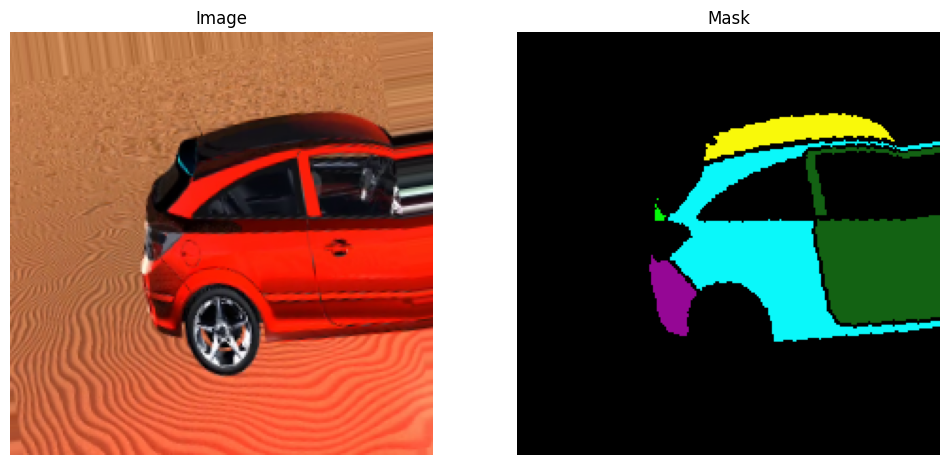

Displaying ph_0092_aug_8.npy


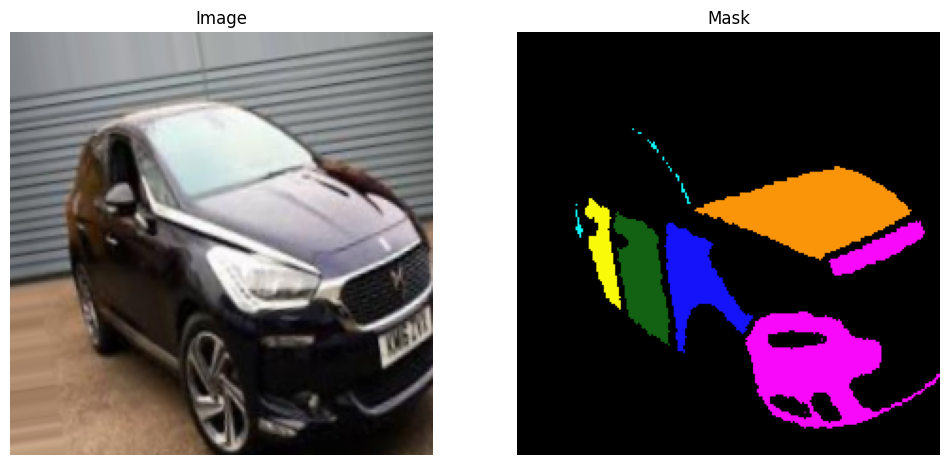

Displaying bl_0458_aug_0.npy


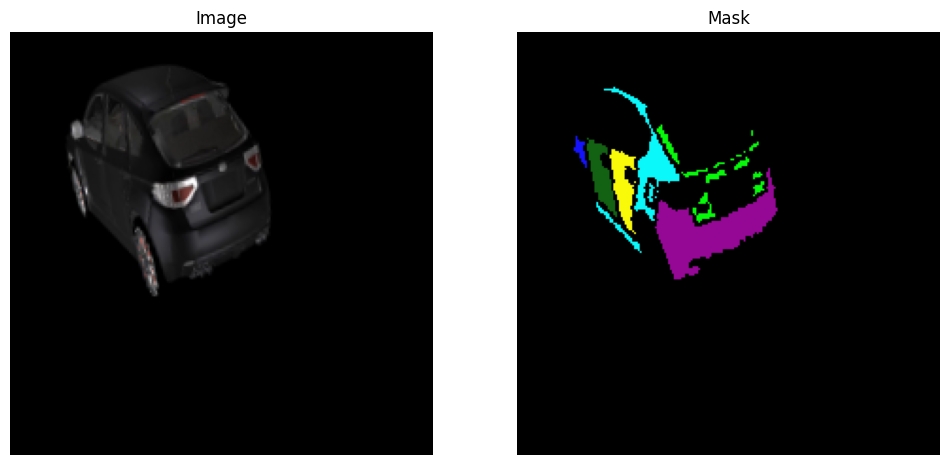

Displaying bl_0181_aug_1.npy


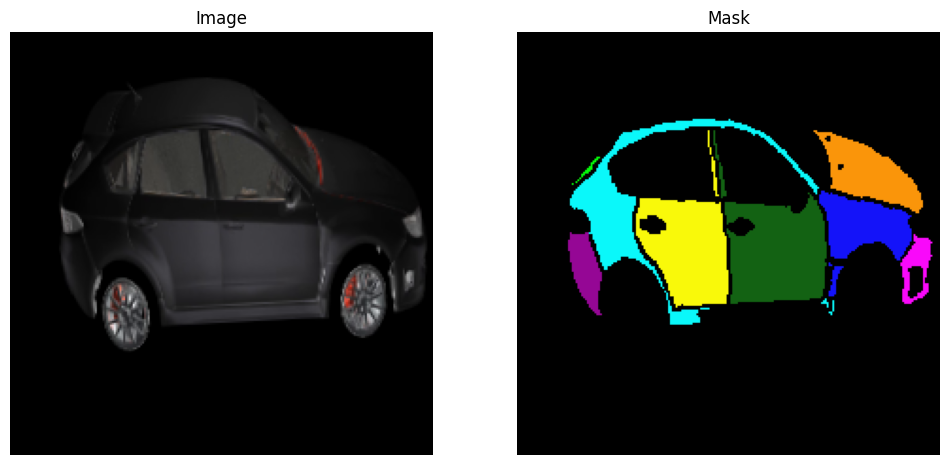

Displaying ph_0076_aug_10.npy


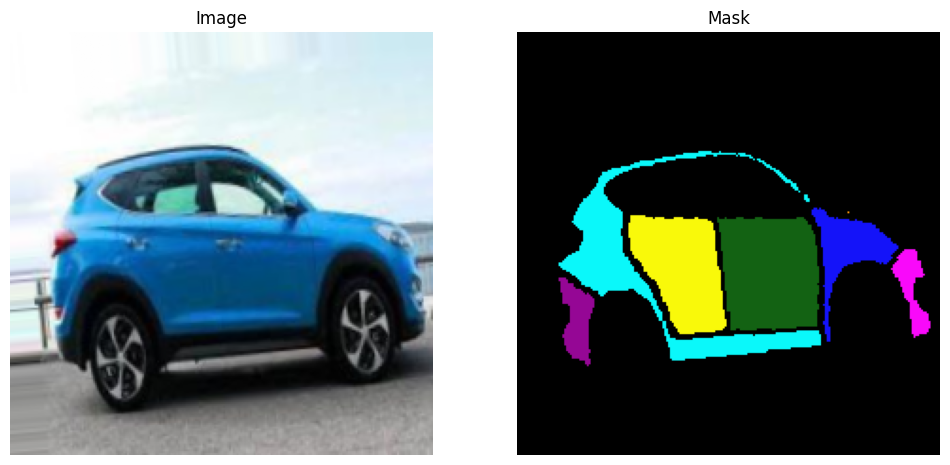

Displaying ph_0019_aug_2.npy


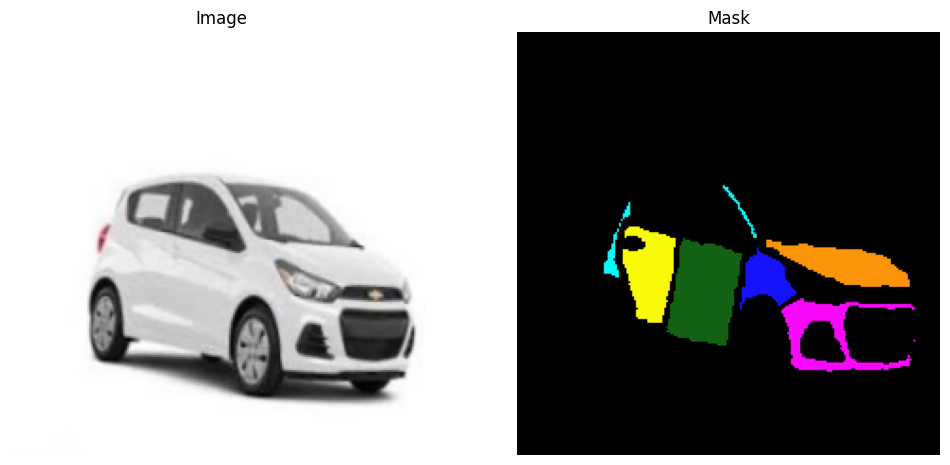

Exception ignored in: <function _xla_gc_callback at 0x7a0a7527caf0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 101, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


Displaying bl_0081_aug_2.npy


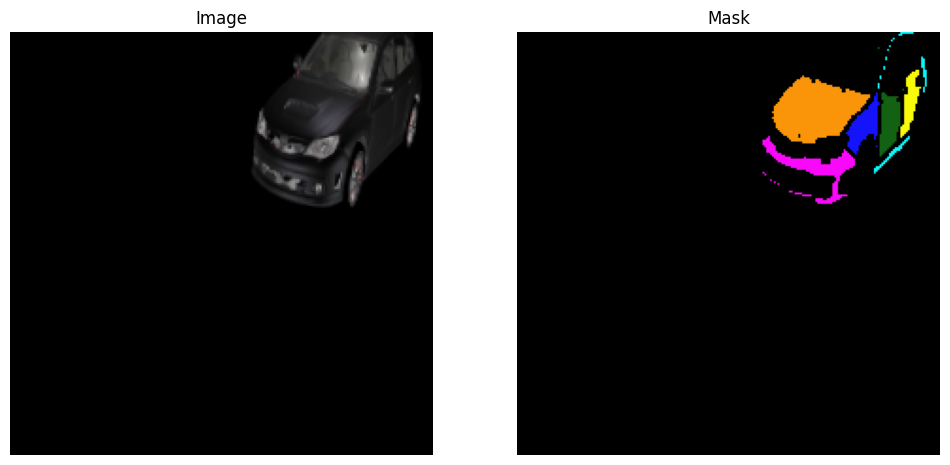

Displaying or_0996.npy


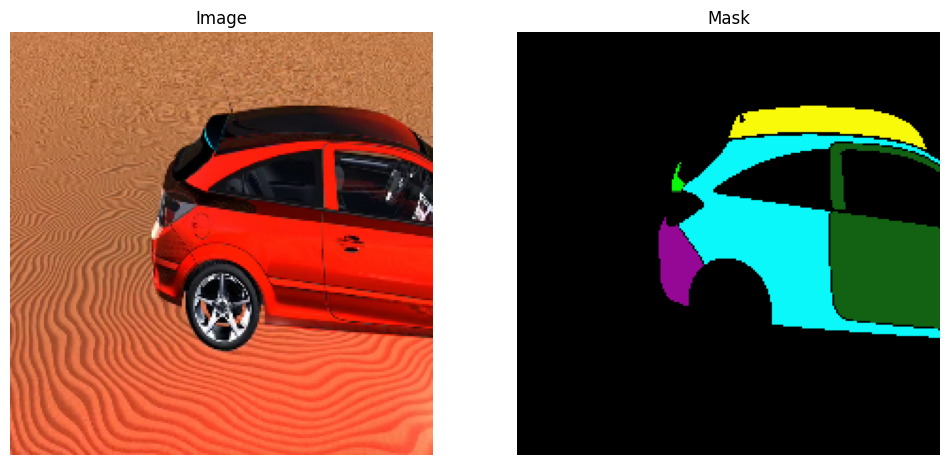

Displaying or_0021_aug_1.npy


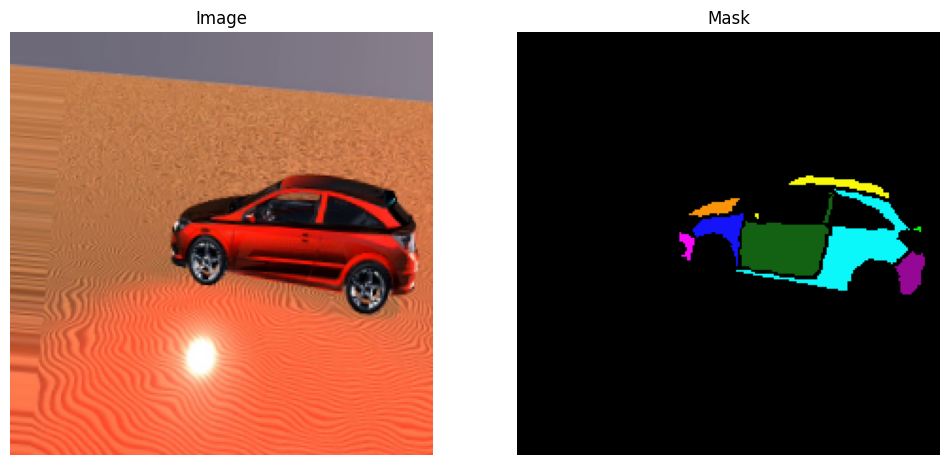

Displaying ph_0095_aug_5.npy


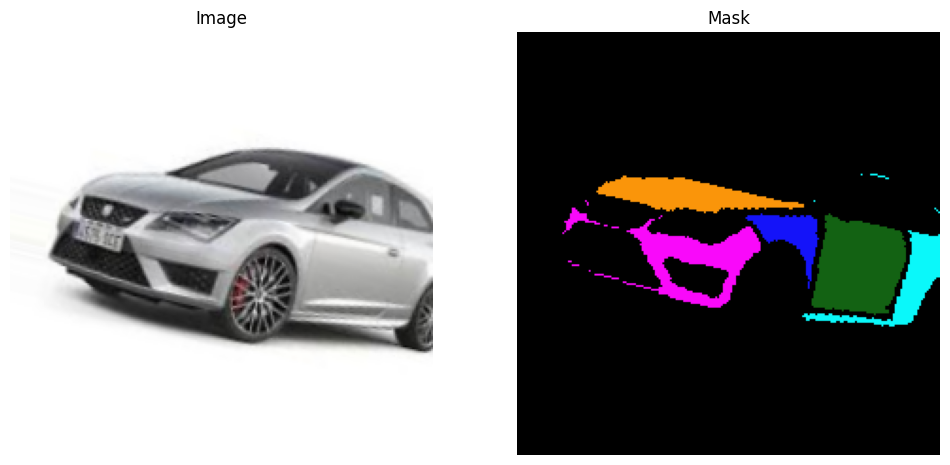

Displaying or_1670_aug_0.npy


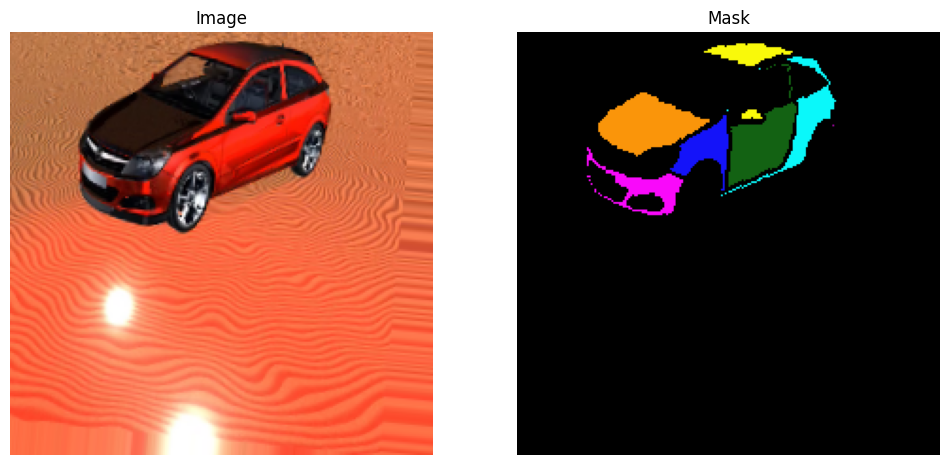

Displaying or_0382.npy


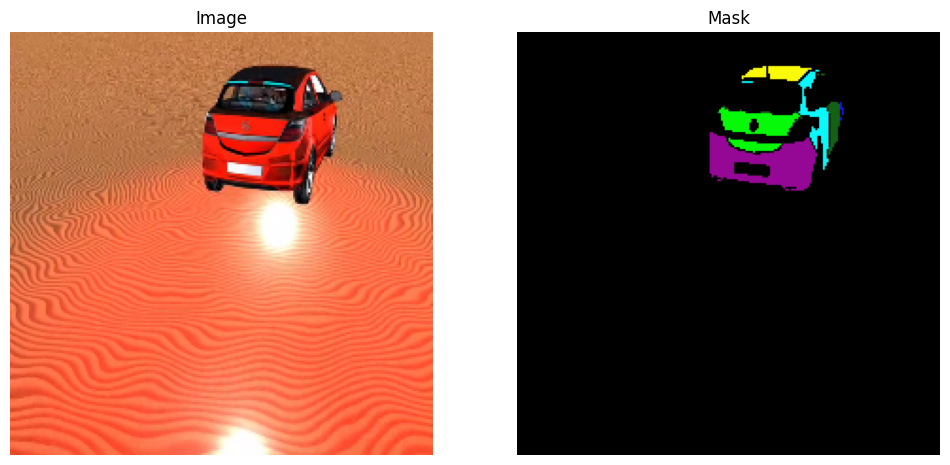

Displaying or_0913.npy


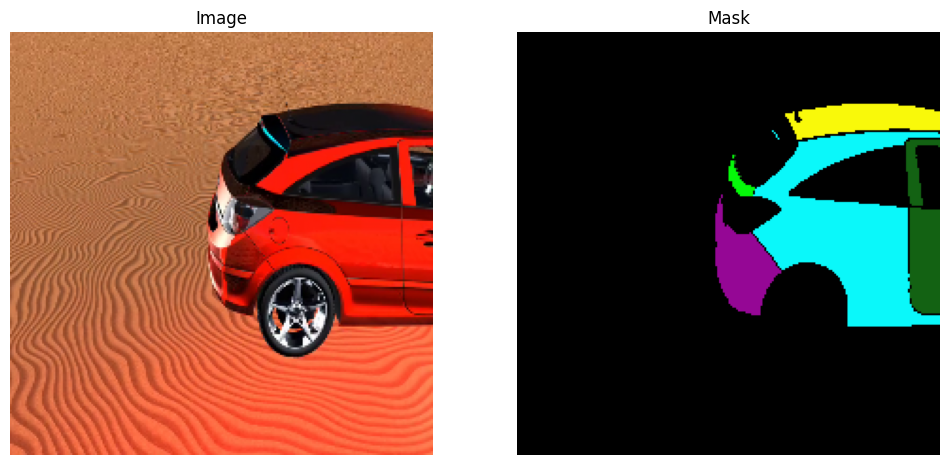

Displaying ph_0059_aug_1.npy


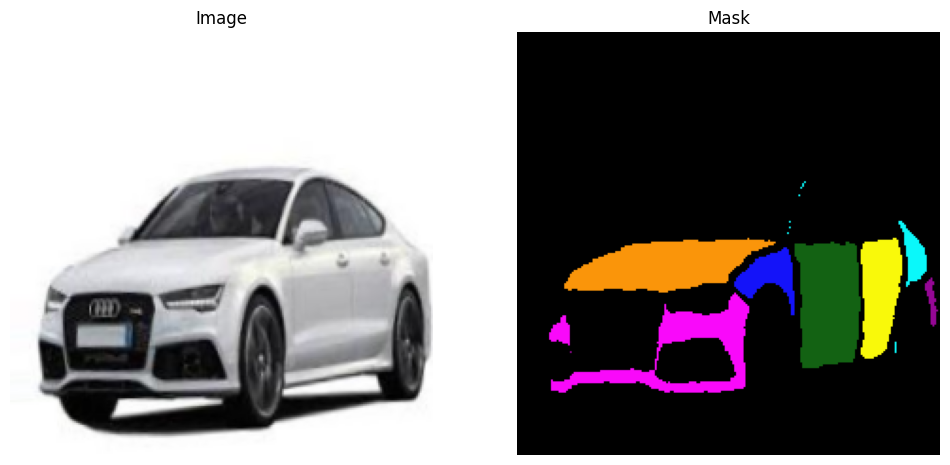

Displaying bl_0192.npy


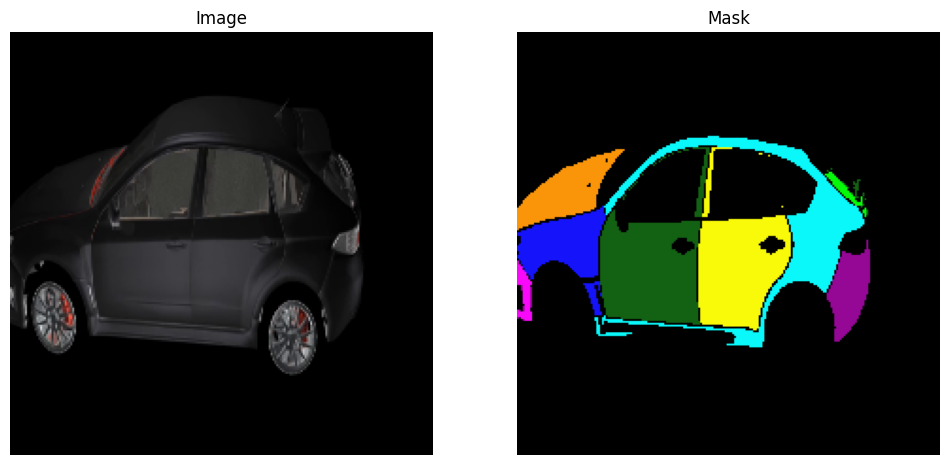

Displaying or_1640.npy


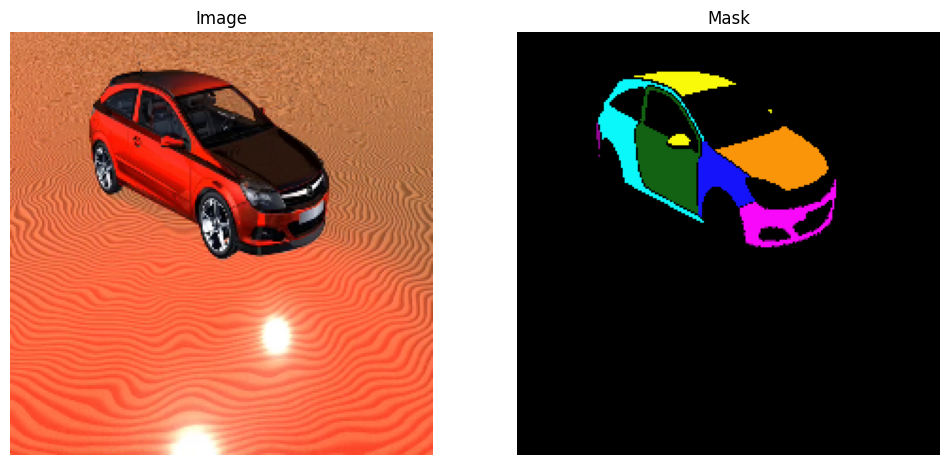

Displaying bl_0087_aug_2.npy


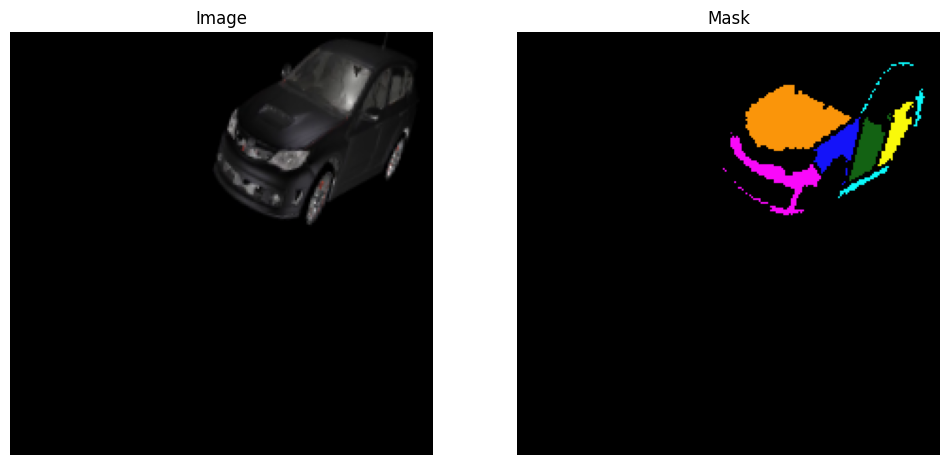

Displaying or_0077_aug_1.npy


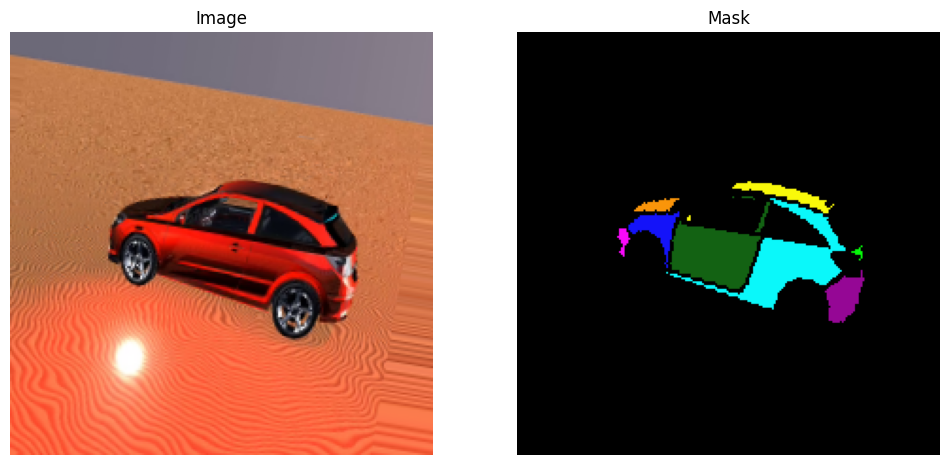

Displaying ph_0023_aug_2.npy


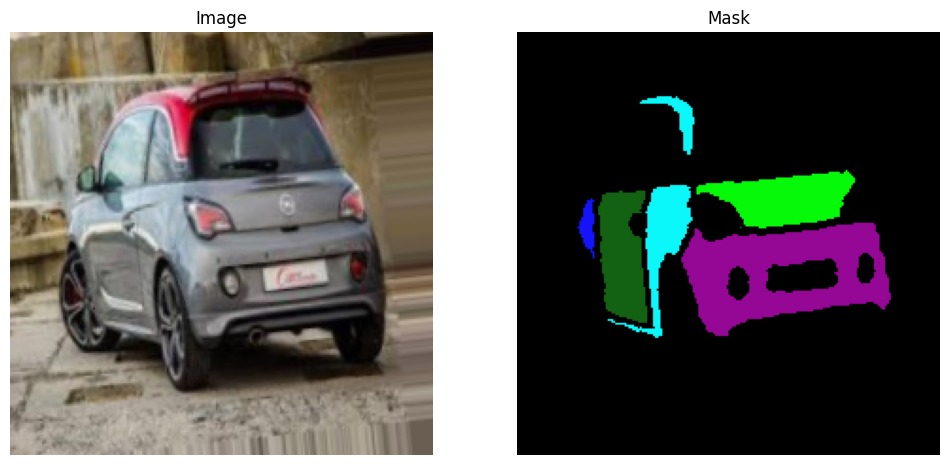

Displaying or_1681_aug_0.npy


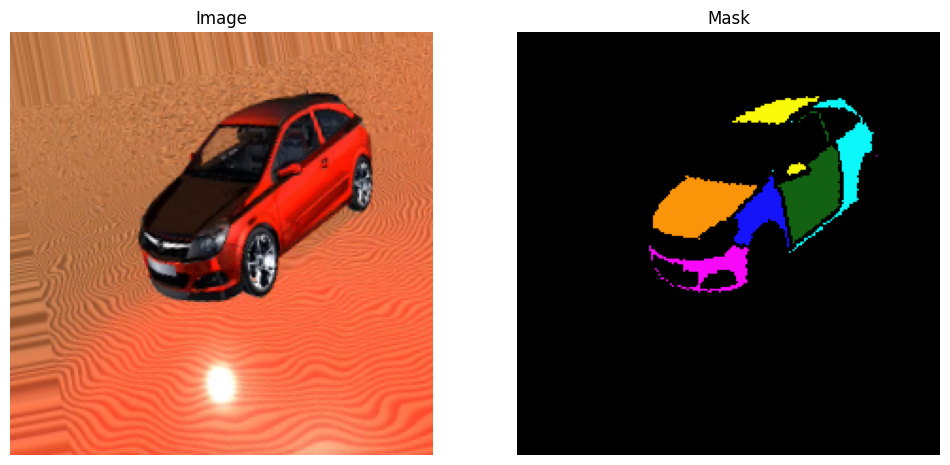

Displaying or_1827_aug_1.npy


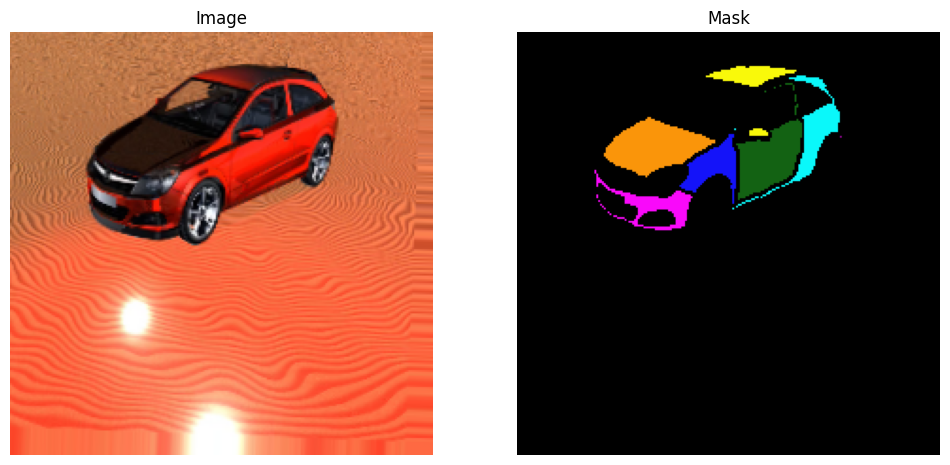

Displaying or_1837_aug_1.npy


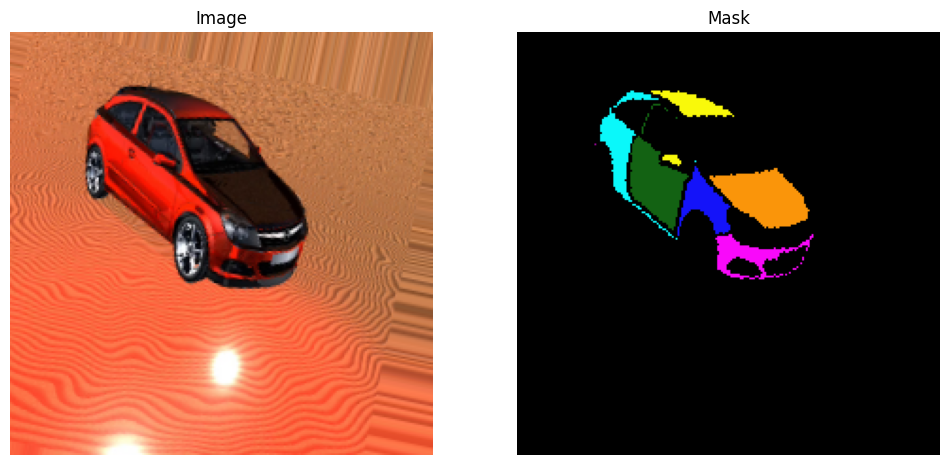

Displaying ph_0157_aug_3.npy


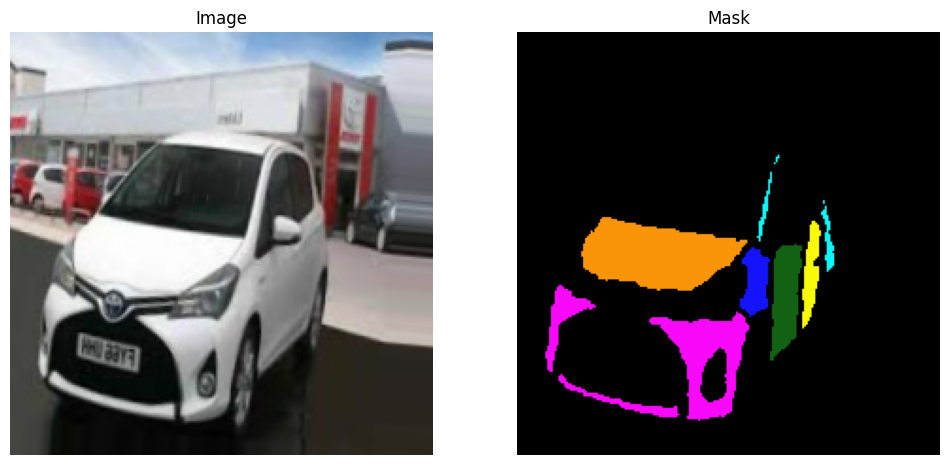

Displaying ph_0156_aug_0.npy


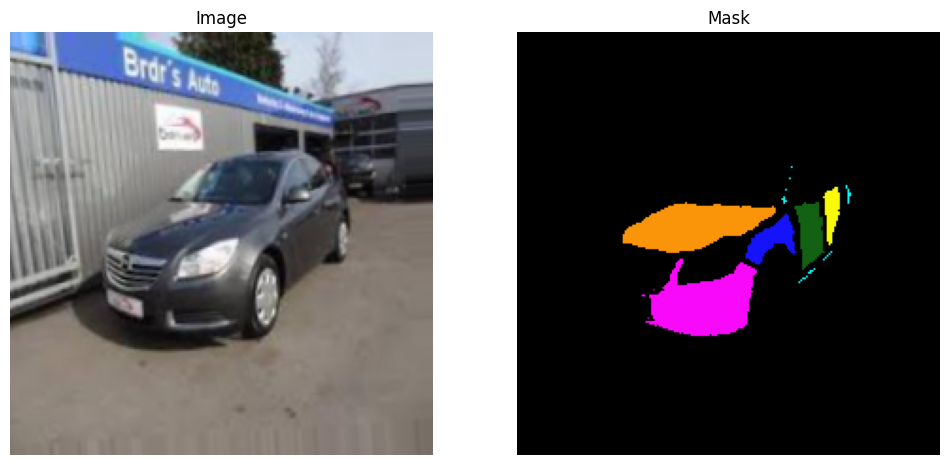

Displaying or_1678_aug_1.npy


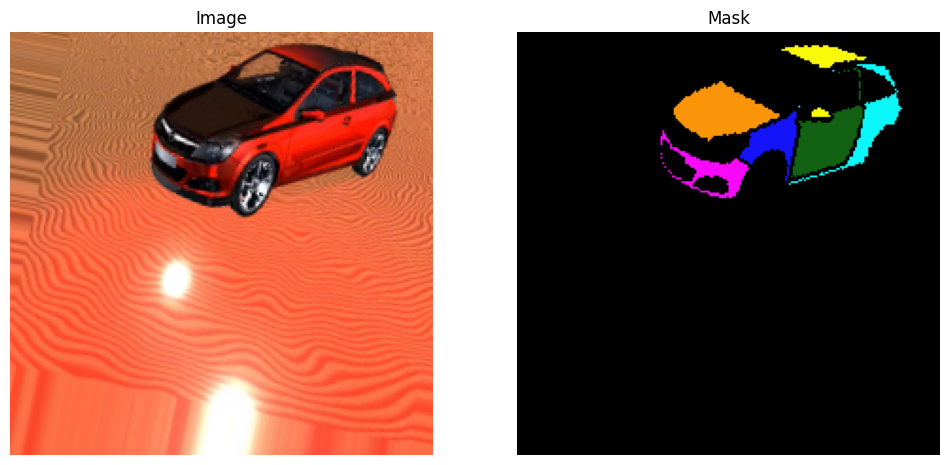

Displaying ph_0056_aug_8.npy


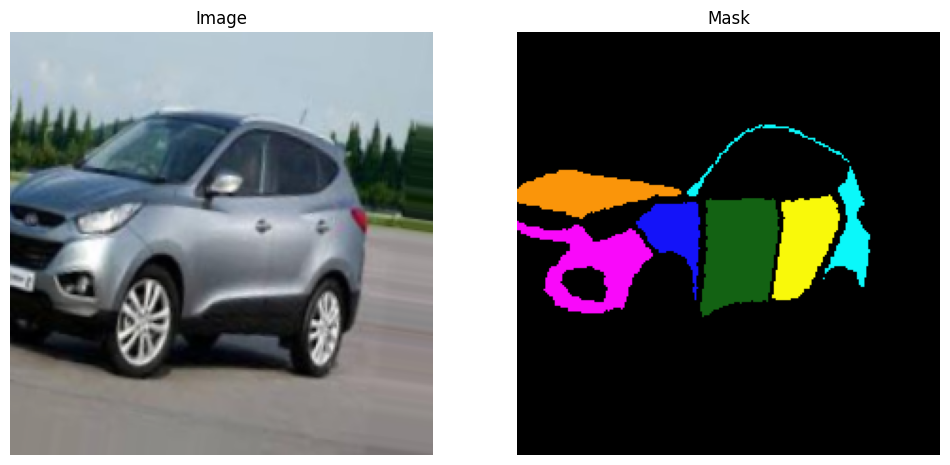

Displaying or_0367.npy


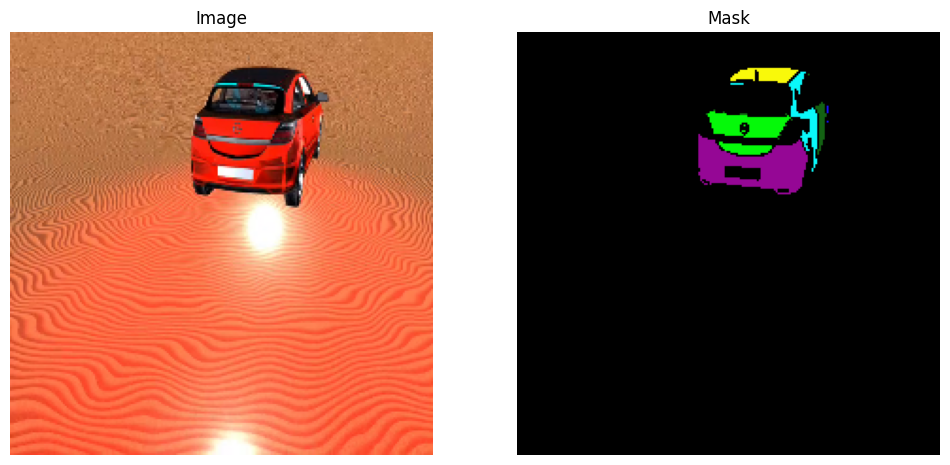

Displaying bl_0127.npy


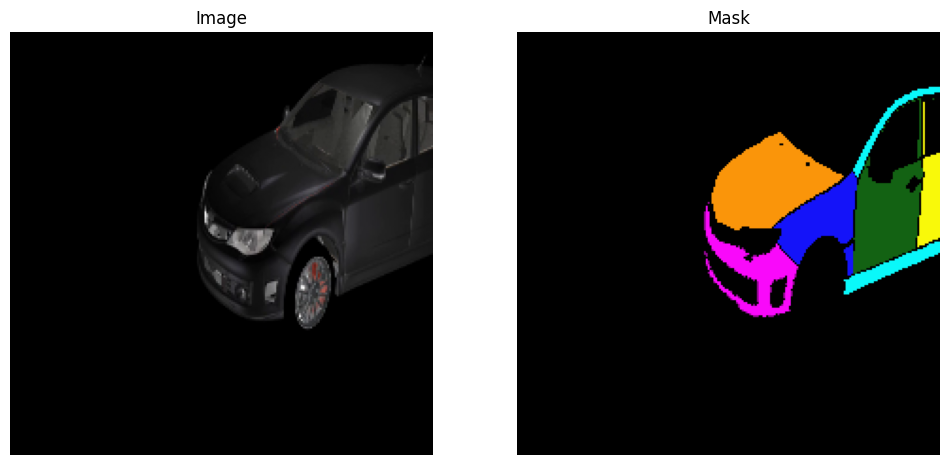

Displaying bl_0160_aug_0.npy


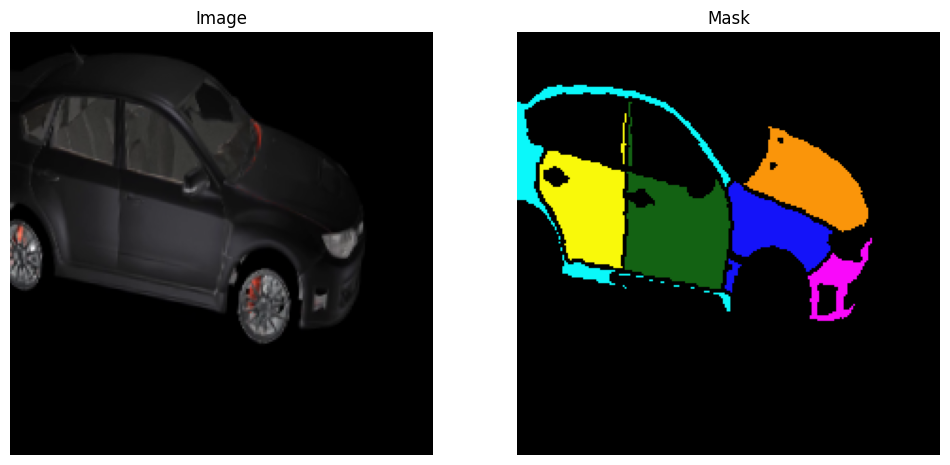

Displaying or_1121_aug_1.npy


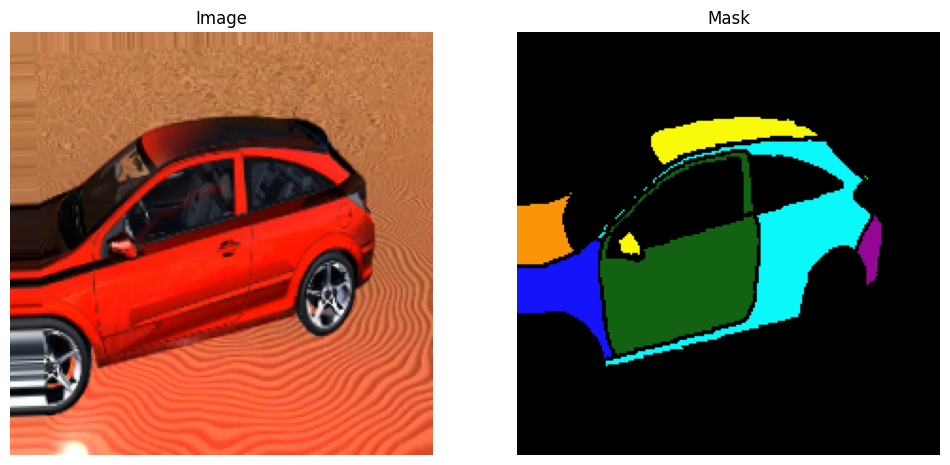

Displaying or_1180_aug_1.npy


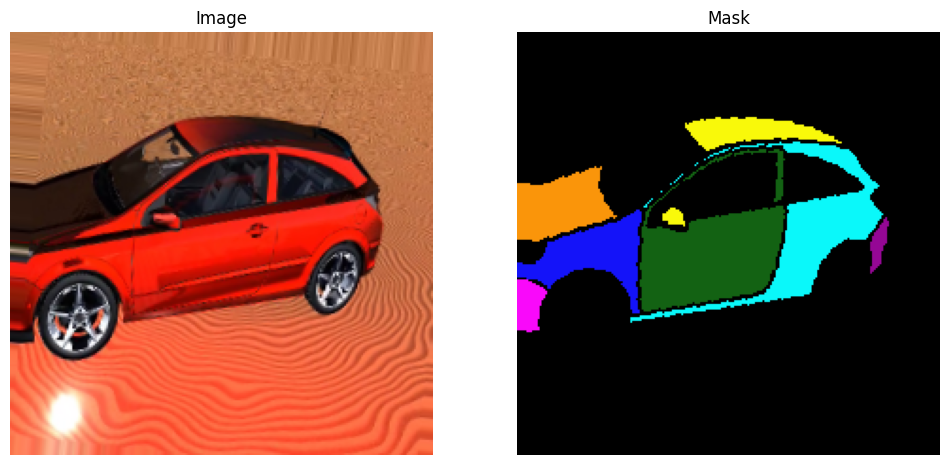

Displaying or_0049_aug_0.npy


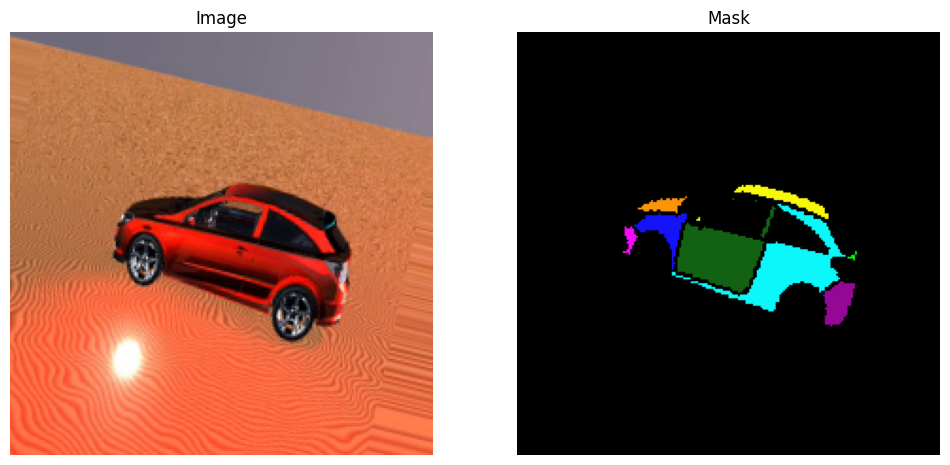

Displaying or_1731_aug_0.npy


KeyboardInterrupt: ignored

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import random

# Define the mapping from class values back to colors
class_to_color = {
    10: (250, 149, 10),  # Orange - Hood
    20: (19, 98, 19),    # Dark Green - Front Door
    30: (249, 249, 10),  # Yellow - Rear Door
    40: (10, 248, 250),  # Cyan - Frame
    50: (149, 7, 149),   # Purple - Rear Quarter Panel
    60: (5, 249, 9),     # Light Green - Trunk Lid
    70: (20, 19, 249),   # Blue - Fender
    80: (249, 9, 250),   # Pink - Bumper
    # Add a default color for any other class values (e.g., "rest of car")
    90: (0, 0, 0)        # Black or any other color for "rest of car"
}

def apply_color_map_to_mask(mask, class_to_color_map):
    colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for class_value, color in class_to_color_map.items():
        colored_mask[mask == class_value] = color
    return colored_mask

def load_and_display_image_and_mask(npy_file_path):
    combined_data = np.load(npy_file_path)
    image_data = combined_data[:, :, :-1]
    mask_data = combined_data[:, :, -1]
    colored_mask = apply_color_map_to_mask(mask_data, class_to_color)

    if image_data.max() > 1.0:
        image_data = image_data / 255.0

    # Display the image and mask
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(image_data, cmap='gray' if image_data.shape[2] == 1 else None)
    plt.title('Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(colored_mask)
    plt.title('Mask')
    plt.axis('off')

    plt.show()

def display_random_images(folder_path, percentage=2):
    all_files = [f for f in os.listdir(folder_path) if f.endswith('.npy')]
    num_files_to_display = max(1, len(all_files) * percentage // 100)
    selected_files = random.sample(all_files, num_files_to_display)

    for file in selected_files:
        npy_file_path = os.path.join(folder_path, file)
        print(f"Displaying {file}")
        load_and_display_image_and_mask(npy_file_path)


folder_path = '/content/drive/MyDrive/DTU/Deep Learning/PROJECT/Data/processed_data'

display_random_images(folder_path)


In [ ]:
import os

folder_path = '/content/drive/MyDrive/DTU/DL/PROJECT/Data/processed_data'  # Replace with your folder path
file_count = len([name for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))])

print(f"Number of files in the folder: {file_count}")

Number of files in the folder: 10224


In [ ]:
import os
import zipfile
from tqdm import tqdm

def create_zip_of_npy(data_directory, zip_filename):
    with zipfile.ZipFile(zip_filename, 'w') as zipf:
        # List all files to be zipped
        all_files = [os.path.join(root, file) for root, dirs, files in os.walk(data_directory) for file in files if file.endswith('.npy')]

        for file_path in tqdm(all_files, desc="Zipping files", unit="file"):
            # Add file to the zip file
            zipf.write(file_path, os.path.relpath(file_path, data_directory))
    return zip_filename

data_directory = "/content/drive/MyDrive/DTU/DL/PROJECT/Data/processed_data"
zip_filename = 'processed_data_npy.zip'

zip_created = create_zip_of_npy(data_directory, zip_filename)
print(f"Zip file created at: {zip_created}")


In [ ]:
from google.colab import files

def download_file_from_colab(file_path):
    try:
        files.download(file_path)
        print(f"File '{file_path}' has been downloaded to your local system.")
    except Exception as e:
        print(f"Error downloading the file: {str(e)}")

file_path = 'processed_data_npy.zip'

download_file_from_colab(file_path)
